In [1]:
import os
import glob
import pandas as pd
import numpy as np
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
from scipy.stats import pearsonr
from adjustText import adjust_text
from tqdm import tqdm
import time
from collections import Counter
from matplotlib.patches import Patch
from scipy.spatial.distance import cdist
import textwrap
import re
import scipy
from scanpy.tools._utils import get_init_pos_from_paga 
import warnings
import networkx as nx

from scipy.stats import zscore
from matplotlib.colors import LinearSegmentedColormap
from scipy.cluster.hierarchy import linkage, fcluster
import matplotlib.patheffects as pe
from collections import defaultdict

import rmm
import cupy
import cudf
import cupy as cp
import cvxpy as cpv
from sklearn.manifold import MDS
from cuml.metrics import pairwise_distances
from cuml.metrics import nan_euclidean_distances
from rmm.allocators.cupy import rmm_cupy_allocator
from sklearn.feature_extraction.text import CountVectorizer
from cuml.linear_model import ElasticNet
import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi
from cuml.manifold.umap import simplicial_set_embedding
from scanpy.tools._utils import get_init_pos_from_paga 
from cuml.manifold.umap import find_ab_params

# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

# Load data

In [2]:
%%time

# path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_merged_gene_data.h5ad"
path = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(path)

# keep only controls
adata = adata[adata.obs['batch'] == 'fib',  :].copy()

# save original phase preds
adata.obs['pred_phase'] = adata.obs['phase']
sc.logging.print_memory_usage() 
adata

Memory usage: current 5.21 GB, difference +5.21 GB
CPU times: user 686 ms, sys: 2.96 s, total: 3.64 s
Wall time: 7.2 s


AnnData object with n_obs × n_vars = 7541 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'pred_phase'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions

# Score cell cycle genes

In [3]:
%%time
regev_genes = [x.strip() for x in open('../../resources/regev_lab_cell_cycle_genes.txt')]
s_genes = regev_genes[:43]
g2m_genes = regev_genes[43:]

sc.tl.score_genes_cell_cycle(
    adata,
    s_genes=s_genes,
    g2m_genes=g2m_genes,
)

adata.obs.head()

CPU times: user 772 ms, sys: 640 ms, total: 1.41 s
Wall time: 1.43 s


,batch,phase,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,...,dpt_order,dpt_order_indices,G1_pseudotime,G1_order,G2M_pseudotime,G2M_order,mean_pseudotime,mean_order,nnz,pred_phase
AAACCAAAGGGTAGCA-1,fib,G2M,4551,8.423322,20400.0,9.923339,26.637255,37.632353,48.764706,63.382353,...,8413,9119,0.513754,10873,0.030250,8413,0.272002,9643.0,4551,G2M
AAACCAAAGTAAGGGT-1,fib,G1,2799,7.937375,10160.0,9.226312,31.633858,43.887795,55.551181,69.793307,...,14772,14080,0.063749,14393,0.492934,14772,0.278342,14582.5,2798,G1
AAACCATTCAGGTAGG-1,fib,G2M,4536,8.420021,20040.0,9.905535,26.007984,36.182635,47.215569,62.255489,...,9850,11564,0.537623,11495,0.060988,9850,0.299305,10672.5,4535,G2M
AAACCATTCCAGCCCT-1,fib,G1,3053,8.024207,13256.0,9.492281,33.607423,47.555824,59.195836,72.789680,...,4543,11249,0.036506,3010,0.467287,4543,0.251897,3776.5,3053,G1
AAACCATTCGTGACCG-1,fib,G1,3221,8.077758,11545.0,9.354094,28.150715,39.081854,50.281507,65.656128,...,14920,10014,0.070529,14597,0.495698,14920,0.283113,14758.5,3221,G1


# Gene filtering

In [4]:
adata.X = adata.layers['raw_counts'].copy()

X = adata.X

if sp.issparse(X):
    # replace NaNs in the nonzero entries
    X.data = np.nan_to_num(X.data, nan=0)
    adata.X = X
else:
    # dense array
    adata.X = np.nan_to_num(X, nan=0)

# adata.X = adata.X.astype(int)
print(f"{adata.X.shape=}")
print(f"{type(adata.X)=}")

adata

adata.X.shape=(7541, 21412)
type(adata.X)=<class 'scipy.sparse._csr.csr_matrix'>


AnnData object with n_obs × n_vars = 7541 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'pred_phase'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions

In [5]:
rsc.get.anndata_to_GPU(adata)

adata.var['filter_pass'] = True # set the gene filter

# disallow mitochondrial and ribosomal genes
adata.var['filter_pass'] = np.where(adata.var.index.str.startswith('MT'), False, adata.var['filter_pass'])
adata.var['filter_pass'] = np.where(adata.var.index.str.startswith('RP'), False, adata.var['filter_pass'])

rsc.get.anndata_to_CPU(adata)

print(adata.var['filter_pass'].value_counts().to_string())

filter_pass
True     21182
False      230


# SCVI

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A100 80GB PCIe MIG 3g.40gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-b0322fd2-c5fa-58ce-9ae8-321051669590]
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 5 records. Best score: 1494.063. Signaling Trainer to stop.


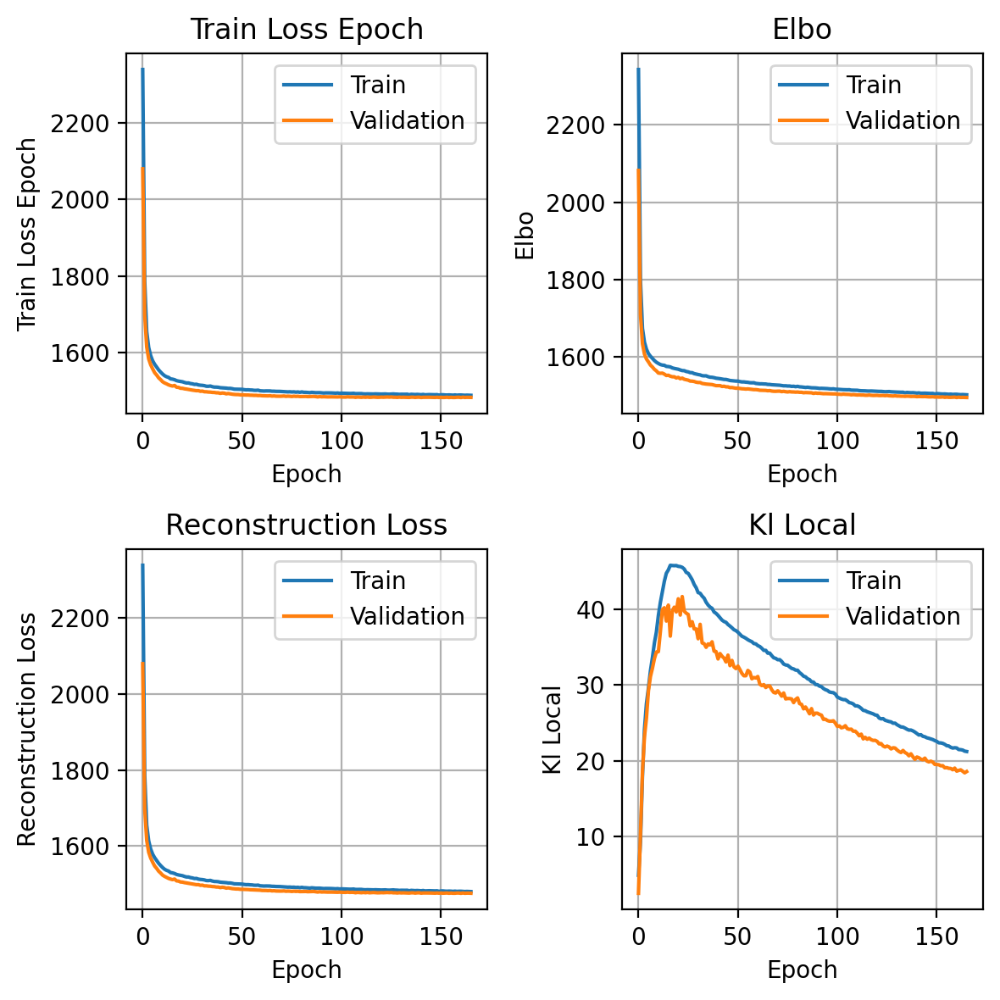

CPU times: user 6min 9s, sys: 4.16 s, total: 6min 14s
Wall time: 6min 22s


In [6]:
%%time
# batch_key = "dataset"

bdata = adata.copy()

bdata = bdata[:, bdata.var['filter_pass']].copy()

rsc.get.anndata_to_GPU(bdata)
rsc.pp.highly_variable_genes(
    bdata,
    flavor="seurat_v3",
    n_top_genes=2500, 
)

bdata = bdata[:, bdata.var['highly_variable']].copy()
rsc.get.anndata_to_CPU(bdata)

# scvi
scvi.model.SCVI.setup_anndata(
    bdata, 
    continuous_covariate_keys=['S_score', 'G2M_score'],
)

model = scvi.model.SCVI(
    bdata,
    n_hidden=128,
    n_latent=24,
    n_layers=2, 
    dropout_rate=0.25, 
    dispersion='gene-cell',
    gene_likelihood='zinb',
)

model.train(
    max_epochs=500,
    accelerator='gpu',
    early_stopping_patience=5, 
    early_stopping=True,
    batch_size=25,
    train_size=0.9,
    plan_kwargs={"lr": 1e-4}, 
)

history = model.history

metrics = [
    ("train_loss_epoch", "validation_loss"),
    ("elbo_train", "elbo_validation"),
    ("reconstruction_loss_train", "reconstruction_loss_validation"),
    ("kl_local_train", "kl_local_validation"),
]

plt.rcParams['figure.dpi'] = 200
fig, axes = plt.subplots(2, 2, figsize=(6, 6))
axes = axes.flatten()

for i, (train_key, val_key) in enumerate(metrics):
    ax = axes[i]
    train_df = history[train_key]
    val_df = history[val_key]

    ax.plot(train_df.index, train_df[train_key], label='Train')
    ax.plot(val_df.index, val_df[val_key], label='Validation')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(train_key.replace('_train', '').replace('_', ' ').title())
    ax.set_title(train_key.replace('_train', '').replace('_', ' ').title())
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

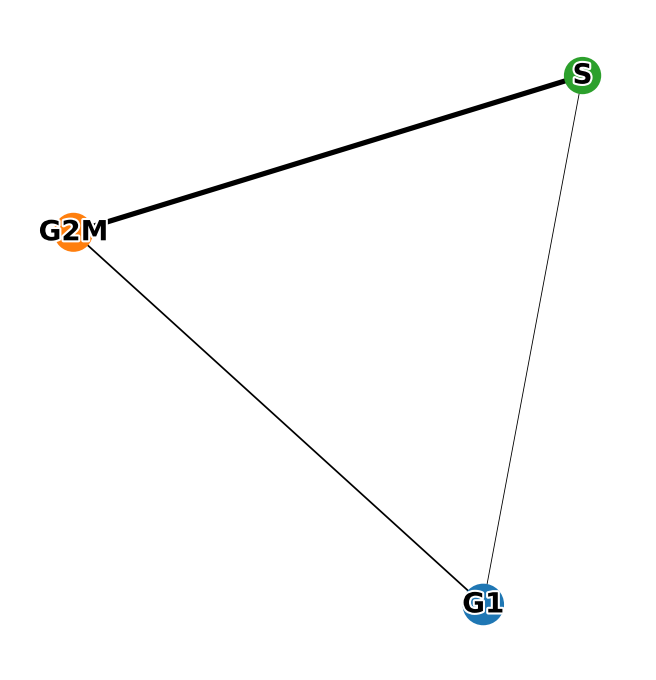

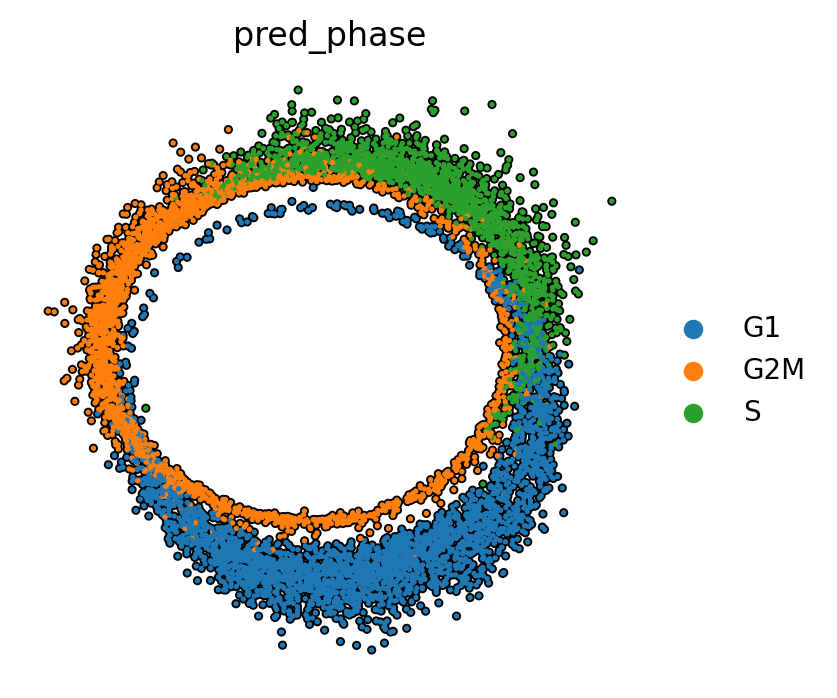

CPU times: user 862 ms, sys: 95.8 ms, total: 958 ms
Wall time: 1.12 s


In [7]:
%%time 
n_neighbors = 25
paga_group_column = "pred_phase"

"""
PAGA
"""
embed = model.get_latent_representation()
embed = sc.AnnData(embed, obs=adata.obs)

rsc.get.anndata_to_GPU(embed)
rsc.pp.pca(embed)

rsc.pp.neighbors(
    embed, n_neighbors=n_neighbors,
)

# plot the embedding
sc.tl.paga(embed, groups=paga_group_column)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.paga(
    embed, 
    fontoutline=1.5, 
    layout='fr',
    edge_width_scale=0.25,  
    frameon=False,          
)

embed.obsm['X_paga'] = get_init_pos_from_paga(embed)
sc.tl.draw_graph(embed, init_pos='paga', layout='fa', niter=2,) 
sc.pl.draw_graph(
    embed, 
    color=['pred_phase'], 
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.5,
)

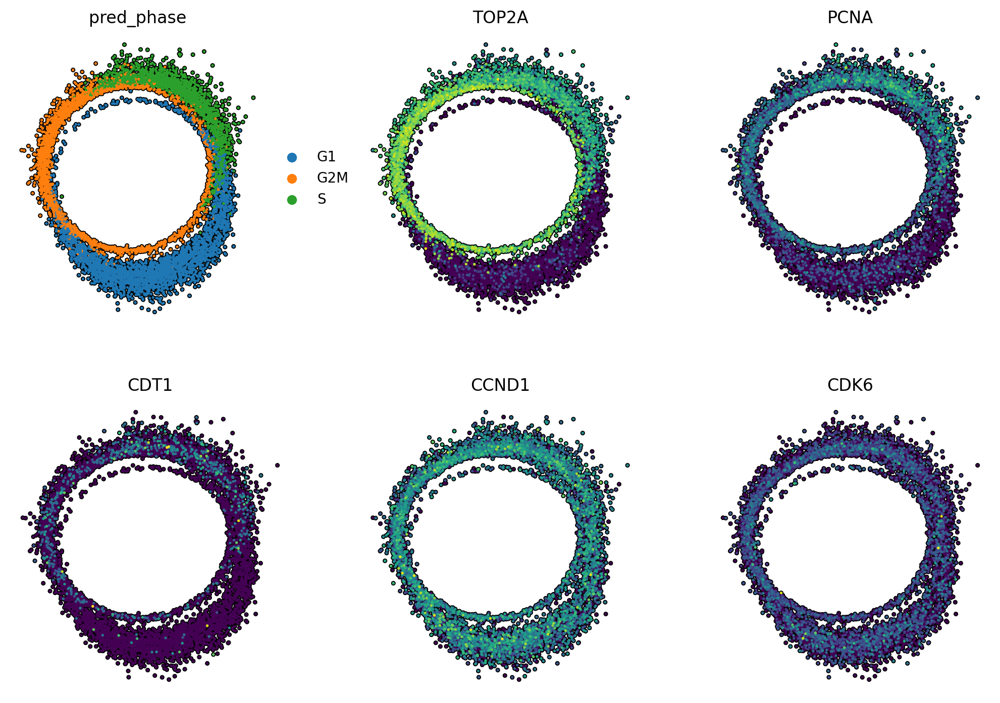

In [8]:
adata.obsm['X_draw_graph_fa'] = embed.obsm['X_draw_graph_fr'].copy()
adata.uns['scvi'] = model.get_normalized_expression()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.25, 4

sc.pl.draw_graph(
    adata, 
    color=['pred_phase', 'TOP2A', 'PCNA', 'CDT1', "CCND1", "CDK6"], 
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

NASP: 2.763
RRM1: 2.217
GMNN: 2.181
CLSPN: 1.786
USP1: 1.661
ATAD2: 1.504
HELLS: 1.260
RAD51AP1: 1.165
RRM2: 1.158
PCNA: 1.058
TYMS: 0.956
BRIP1: 0.693
POLD3: 0.683
MCM4: 0.544
MSH2: 0.516
PRIM1: 0.406
TIPIN: 0.354
CASP8AP2: 0.346
RPA2: 0.343
POLA1: 0.338
DTL: 0.312
GINS2: 0.306
MCM6: 0.299
WDR76: 0.284
FEN1: 0.278
MCM5: 0.260
SLBP: 0.260
RFC2: 0.254
CDC6: 0.245
UBR7: 0.219
BLM: 0.171
RAD51: 0.161
E2F8: 0.156
UHRF1: 0.155
UNG: 0.152
CCNE2: 0.136
EXO1: 0.126
MCM2: 0.117
DSCC1: 0.113
CDCA7: 0.111
CDC45: 0.108
CHAF1B: 0.066


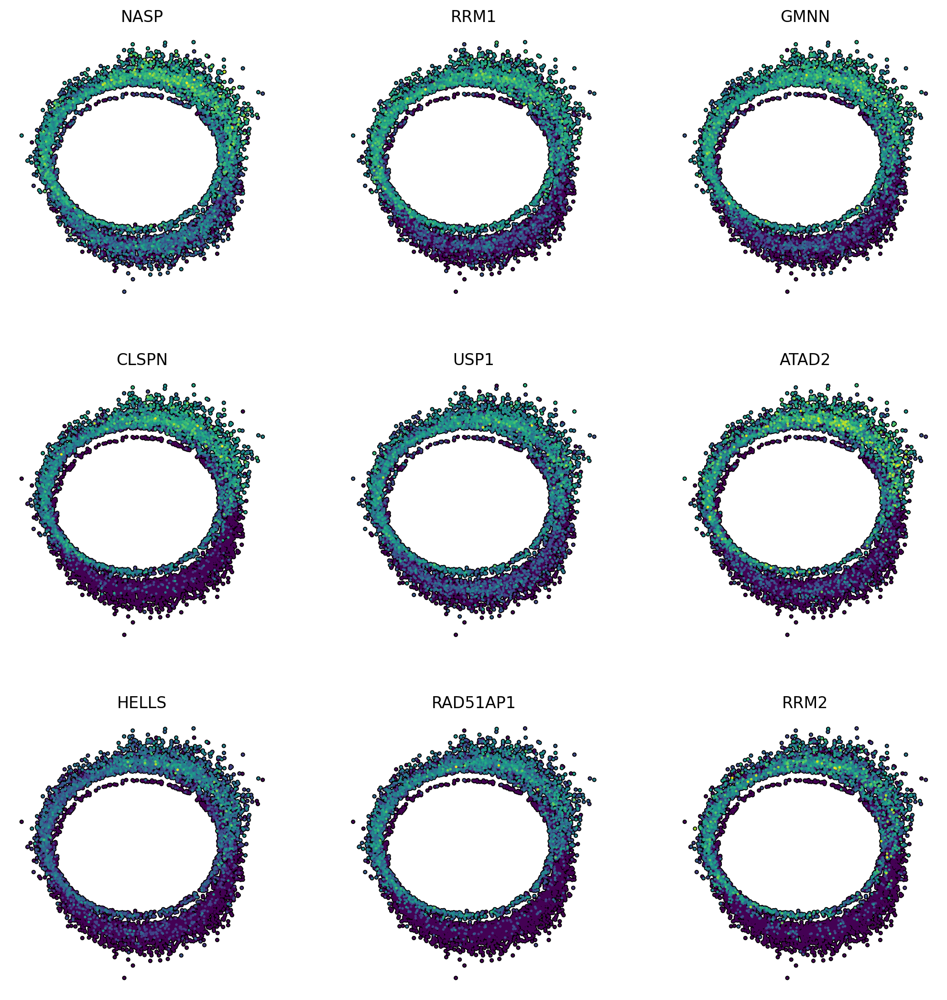

In [9]:
s_genes = [x for x in s_genes if x in adata.var_names]

X = adata[:, s_genes].X.toarray()
# compute per‐gene means and sort descending
means = X.mean(axis=0)                # shape (n_genes,)
order = np.argsort(means)[::-1]       # highest first
s_genes = [s_genes[i] for i in order]

# now print the expression values for each gene:
for i, gene in enumerate(s_genes):
    vals = X[:, order[i]]
    print(f"{gene}: {vals.mean():.3f}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.25, 4

sc.pl.draw_graph(
    adata, 
    color=s_genes[:9], 
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

TOP2A: 8.918
HMGB2: 7.416
CKS2: 7.110
CENPF: 5.399
UBE2C: 4.835
SMC4: 4.411
NUSAP1: 4.304
TUBB4B: 4.022
TPX2: 3.778
TMPO: 3.656
CKAP2: 3.126
CBX5: 2.978
ANP32E: 2.958
MKI67: 2.822
CKS1B: 2.587
CENPE: 2.214
DLGAP5: 2.179
KIF20B: 2.088
ANLN: 2.026
BIRC5: 1.980
GTSE1: 1.817
HMMR: 1.790
ECT2: 1.704
CDK1: 1.592
CDCA8: 1.562
AURKA: 1.323
KIF23: 1.255
TACC3: 1.246
NDC80: 1.146
CKAP5: 1.133
KIF2C: 1.084
TTK: 1.027
CDCA2: 0.996
NUF2: 0.972
KIF11: 0.968
RANGAP1: 0.814
CDC20: 0.770
NCAPD2: 0.744
CKAP2L: 0.741
HJURP: 0.729
BUB1: 0.711
G2E3: 0.612
CDCA3: 0.576
CCNB2: 0.504
LBR: 0.500
AURKB: 0.467
GAS2L3: 0.422
CTCF: 0.413
NEK2: 0.389
CENPA: 0.384
CDC25C: 0.318
PSRC1: 0.179


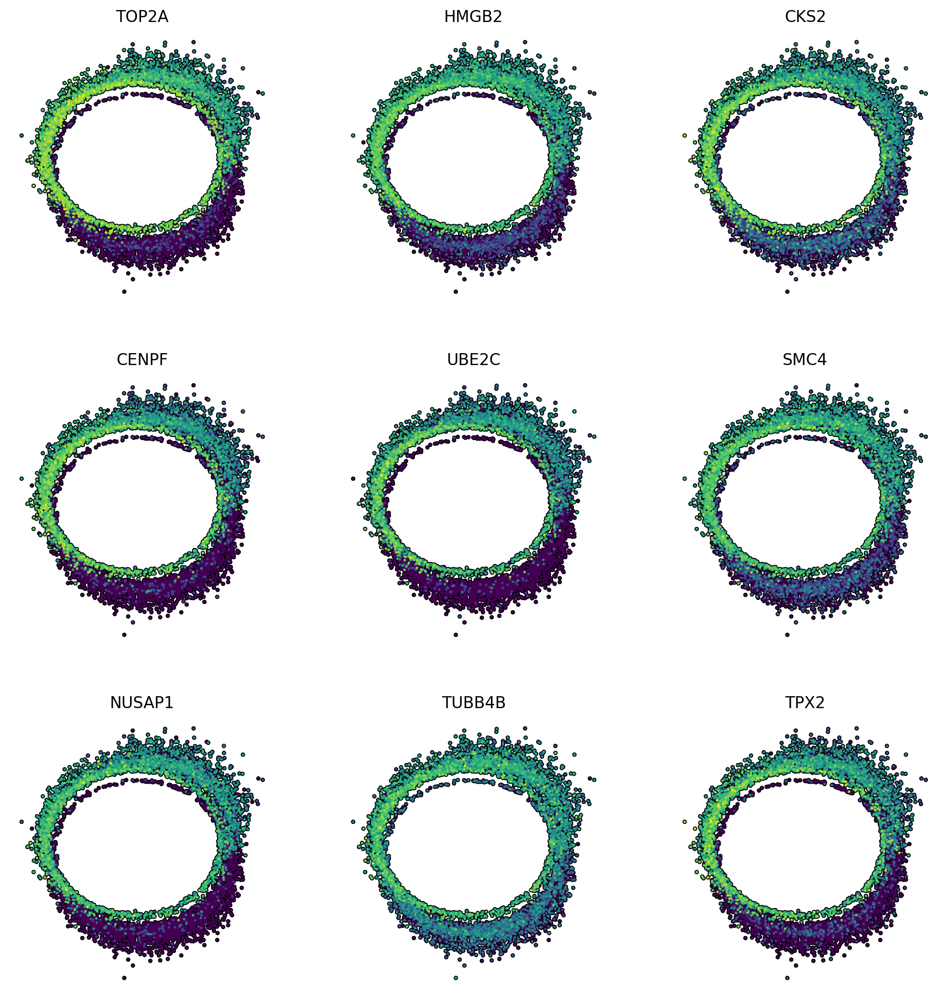

In [10]:
g2m_genes = [x for x in g2m_genes if x in adata.var_names]

X = adata[:, g2m_genes].X.toarray()
# compute per‐gene means and sort descending
means = X.mean(axis=0)                # shape (n_genes,)
order = np.argsort(means)[::-1]       # highest first
g2m_genes = [g2m_genes[i] for i in order]

# now print the expression values for each gene:
for i, gene in enumerate(g2m_genes):
    vals = X[:, order[i]]
    print(f"{gene}: {vals.mean():.3f}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.25, 4

sc.pl.draw_graph(
    adata, 
    color=g2m_genes[:9], 
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

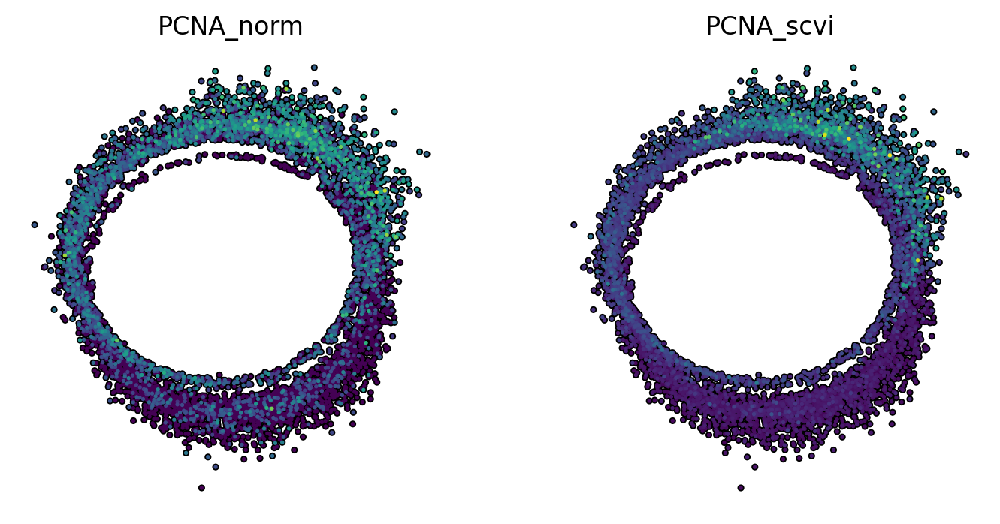

In [11]:
query = 'PCNA'

adata.obs['query'] = adata.uns['scvi'][query].copy()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.25, 4

sc.pl.draw_graph(
    adata, 
    color=[query, 'query'], 
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
    title=[f'{query}_norm', f'{query}_scvi']
)

In [106]:
# gene_list = [
#     'YAP1', 'COPB2', 'SMAD1', 'SFN', 'CTNNB1', 'SLC9A3R1', 
#     'YWHAQ', 'DYNLL2', 'SMAD7', 'MAP2K1', 'YWHAZ', 'WBP1',
#     'YWHAB', 'TP73', 'PTPN14', 'YWHAH', 'AMOT', 'TP63', 
#     'TRERF1', 'PRRG2', 'DDX17', 'UVRAG', 'LATS1', 'TEAD1',
#     'TEAD2', 'YWHAE', 'SLC9A3R2', 'YWHAG', 'PRRG4', 'WBP2',
#     'BTRC','WWTR1', 'DVL1', 'TEAD3', 'VGLL1', 'TEAD4', 
#     'VGLL4', 'TRIM27', 'KRT40',
# ]

gene_list = [
    'CHD3', 'CHD4', 'CHD5', 'CDK2AP1', 'GATAD2A', 'GATAD2B', 'HDAC1', 'HDAC2', 
    'MBD2', 'MBD3', 'MTA1', 'MTA2', 'MTA3', 'RBBP4', 'RBBP7',
    'SAP30', 'SAP18', 'MRG15', 'PHF1', 'EMSY', 'RBP2', 'ARID3A',
    'ZMYM3', 'ZMYM2', 'PHF21A', 'KDM1A', 'ZNF217', 'CTBP1', 'GTF2I', 'HMG20B', 'RCOR1', 'RCOR2', 'RCOR3',
    'MIDEAS', 'TRERF1', 'ZNF541', 'DNTTIP1', 'CDK1', 'CDK2', 'CCNA2',
]

gene_list = [x for x in gene_list if x in adata.var_names]
# gene_list = [x for x in gene_list if x in adata.uns['scvi'].columns]
# gene_list

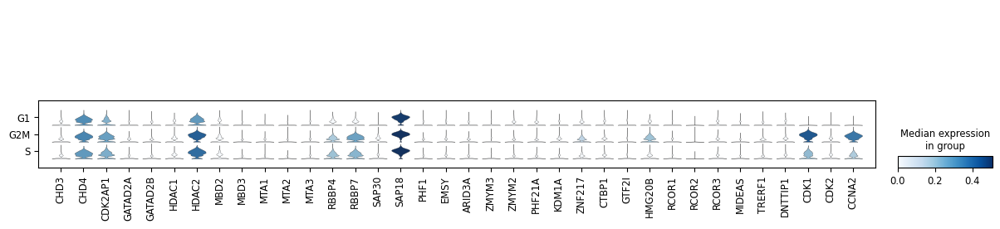

In [25]:
plt.rcdefaults()
sc.pl.stacked_violin(
    adata,
    groupby='pred_phase',
    # groupby='pooled_condition',
    # var_names=['NUMB', 'ITCH', 'HES1', 'YAP1', 'MDM2', 'MYC', 'JUN', 'FOXO3', 'NOTCH1', 'NOTCH2', 'RB1', 'RBPJ', 'TOP2A', 'KLF2', 'KLF7'],
    var_names=gene_list,
    layer='log_norm',
    standard_scale='var',
)

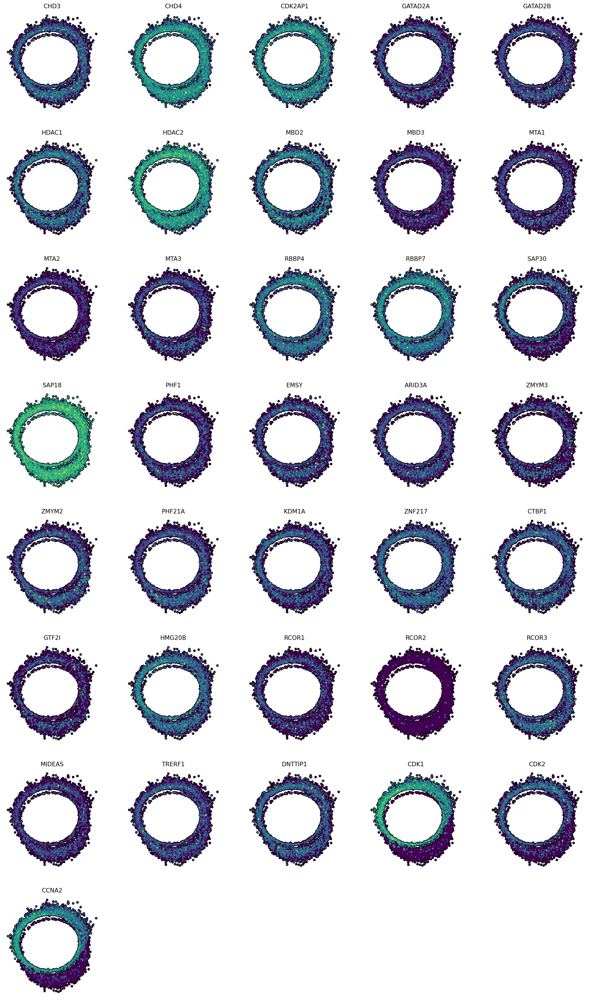

In [26]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.25, 4

sc.pl.draw_graph(
    adata, 
    color=gene_list, 
    size=35,
    ncols=5,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

In [32]:
path_2025 = "/home/jrcwycy/.cache/gseapy/Enrichr.GO_Biological_Process_2025.gmt"

geneset_dict = {}

with open(path_2025, "r") as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 1:
            term = parts[0].strip()
            genes = parts[2:] if len(parts) > 2 else []
            genes = [g.strip() for g in genes if g.strip()]
            geneset_dict[term] = genes

geneset = pd.DataFrame.from_dict(geneset_dict, orient='index').T

In [33]:
[col for col in geneset if 'hippo' in col.lower()]

['Hippo Signaling (GO:0035329)',
 'Negative Regulation of Hippo Signaling (GO:0035331)',
 'Positive Regulation of Hippo Signaling (GO:0035332)',
 'Regulation of Hippo Signaling (GO:0035330)']

In [52]:
term = 'Hippo Signaling (GO:0035329)'

hippo = geneset[term].unique()
geneset[term].nunique()


20

20


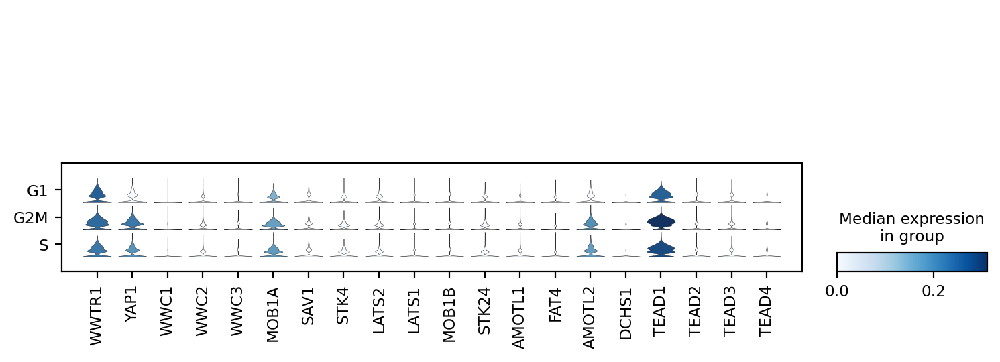

In [53]:
gene_list = [gene for gene in hippo if gene in adata.var_names]
print(len(gene_list))

sc.pl.stacked_violin(
    adata,
    groupby='pred_phase',
    var_names=gene_list,
    layer='log_norm',
    standard_scale='var',
)

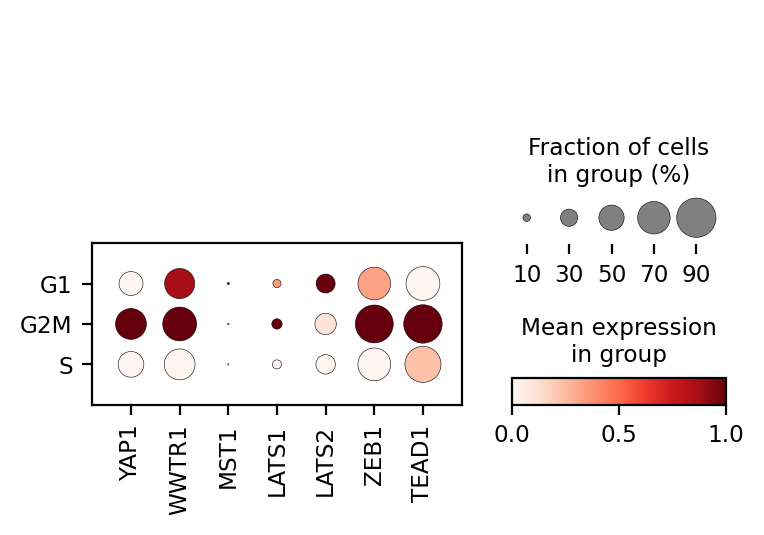

In [62]:
gene_list = [
    'YAP1', 'WWTR1', # YAP/TAZ
    'MST1', 'MST2', 'LATS1', 'LATS2',
    'ZEB1', 'TEAD1',
]

gene_list = [gene for gene in gene_list if gene in adata.var_names]


sc.pl.dotplot(
    adata,
    groupby='pred_phase',
    layer='log_norm',
    var_names=gene_list,
    # vmin=0,
    # vmax=1,
    # mean_only_expressed=True,
    standard_scale='var',
)

# plt.rcParams['figure.dpi'] = 200
# plt.rcParams['figure.figsize'] = 3.25, 4

# sc.pl.draw_graph(
#     adata, 
#     color=gene_list, 
#     size=35,
#     ncols=3,
#     alpha=1,
#     use_raw=False,
#     layer='log_norm',
#     add_outline=True,
#     colorbar_loc=None,
#     outline_color=('k', 'k'),
#     frameon=False,
#     wspace=0.25,
# )

In [71]:
adata

AnnData object with n_obs × n_vars = 7541 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'pred_phase'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions

In [93]:
adata.X = adata.layers['log_norm']

sc.pp.highly_variable_genes(
    adata,
    batch_key='pred_phase',
    # n_top_genes=
    n_top_genes=5000, 
    # flavor='seurat_v3',
)

# sc.pl.highly_variable_genes(
#     adata,
# )

In [94]:
hv_genes = adata.var[adata.var['highly_variable']]
# ranked_hv_genes = hv_genes.sort_values('variance_norm', ascending=False)
ranked_hv_genes = hv_genes.sort_values('dispersions_norm', ascending=False)
print(ranked_hv_genes.head(100).index.tolist())

['CCL5', 'MT1G', 'CXCL3', 'TNFSF10', 'CXCL8', 'CSF2', 'SST', 'NLGN1', 'IL6', 'SERPINB2', 'POSTN', 'CXCL1', 'KCNQ5', 'MGP', 'KIRREL3', 'NALF1', 'MMP1', 'MT1H', 'CXCL11', 'CXCL2', 'IL1B', 'SFRP2', 'CXCL6', 'C15orf48', 'PTGDS', 'SAA1', 'STMN2', 'BEX1', 'MAGI2', 'AREG', 'PDE4B', 'FBXL7', 'RARRES2', 'CXCL10', 'KIF26B', 'EXT1', 'CACNA1C', 'PTX3', 'PPP1R14A', 'KISS1', 'RSAD2', 'MAGI1', 'CXCL5', 'CCDC85A', 'PTGS2', 'PRKD1', 'CRIP1', 'PENK', 'ACTA2', 'MIR924HG', 'TFPI2', 'CCL2', 'KRT81', 'ROR1', 'PRKG1', 'DCLK2', 'HMGA2', 'MAML2', 'AFF3', 'TRIO', 'CCL7', 'ENSG00000254951', 'PTPRG', 'CCL8', 'ISG20', 'GRIK2', 'ANKRD1', 'WWOX', 'PRR16', 'CCL20', 'MT1M', 'IFIT2', 'FTX', 'MIR31HG', 'ENSG00000232855', 'CCN3', 'ACTC1', 'ENSG00000289530', 'NRG1', 'PDE1C', 'PLAAT4', 'RAD51B', 'CYP1B1', 'RORA', 'MMP3', 'NHS', 'PARD3B', 'CSF3', 'ENSG00000273674', 'AKR1C1', 'LINC02899', 'PVT1', 'RGS7', 'GPC6', 'SOD2', 'EREG', 'CHI3L1', 'ENSG00000285744', 'EFNA5', 'ZBTB20-AS1']


In [108]:
query = ['ZEB1']

tmp = adata.var[adata.var.index.isin(gene_list)]

tmp[['highly_variable', 'means',
       'dispersions', 'dispersions_norm', 'highly_variable_nbatches',
       'highly_variable_intersection', 'feature_id', 'filter_pass',
       'highly_variable_rank', 'variances', 'variances_norm']].head(len(gene_list))

,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,feature_id,filter_pass,highly_variable_rank,variances,variances_norm
ARID3A,False,0.192197,0.114686,0.262223,1,False,ENSG00000116017,True,NaN,0.317507,0.964805
CCNA2,False,0.572050,0.216519,0.223994,1,False,ENSG00000145386,True,195.0,4.654212,2.157669
CDK1,False,0.629856,0.150807,0.025001,0,False,ENSG00000170312,True,203.0,5.420812,2.124733
CDK2,False,0.160795,-0.069597,-0.243253,0,False,ENSG00000123374,True,NaN,0.298311,1.081230
CDK2AP1,False,0.648375,-0.117063,-0.578228,0,False,ENSG00000111328,True,NaN,1.862838,0.929213
CHD3,False,0.279358,0.087572,0.146737,0,False,ENSG00000170004,True,NaN,0.494667,0.950783
CHD4,False,0.987343,0.132900,-0.097090,0,False,ENSG00000111642,True,NaN,4.113546,0.929092
CTBP1,False,0.232241,-0.076338,-0.265572,0,False,ENSG00000159692,True,NaN,0.386643,0.911112
DNTTIP1,False,0.213964,-0.093259,-0.306387,0,False,ENSG00000101457,True,NaN,0.356749,0.909915
EMSY,True,0.180788,0.183417,0.462195,2,False,ENSG00000158636,True,NaN,0.269735,0.946298


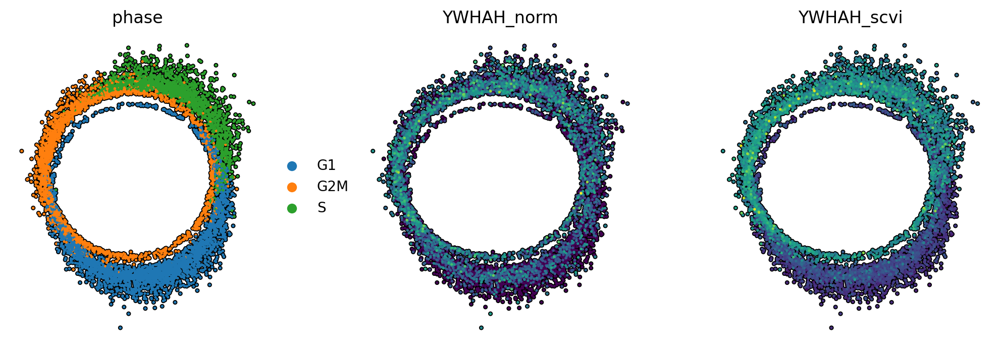

In [13]:
query = 'YWHAH'

adata.obs['query'] = adata.uns['scvi'][query].copy()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.25, 4

sc.pl.draw_graph(
    adata, 
    color=['pred_phase', query, 'query'], 
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
    title=['phase', f'{query}_norm', f'{query}_scvi']
)



In [ ]:
break